In [1]:
#Basic libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from datetime import datetime
from pandas import DataFrame 
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf 
from statsmodels.graphics.tsaplots import plot_pacf
from pandas.plotting import lag_plot 
from statsmodels.tsa.stattools import adfuller 
from numpy import sqrt
from numpy import log
from numpy import cbrt
from numpy import exp
import statsmodels.formula.api as smf 
from statsmodels.tsa.holtwinters import SimpleExpSmoothing 
from statsmodels.tsa.holtwinters import Holt
from statsmodels.tsa.holtwinters import ExponentialSmoothing 
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import GRU, Dense
from keras.layers import LSTM
from keras  import callbacks
from keras import optimizers
import math
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.ar_model import AutoReg
import pmdarima as pmd
from pmdarima import auto_arima 
from statsmodels.tsa.arima.model import ARIMA 
import statsmodels.api as sm 

In [2]:
import warnings
warnings.filterwarnings('ignore') 

## Loading the data

In [3]:
data=pd.read_csv("oil data update.csv")
data 

,Date,Price
0,02-01-1986,25.56
1,03-01-1986,26.00
2,06-01-1986,26.53
3,07-01-1986,25.85
4,08-01-1986,25.87
...,...,...
9340,15-12-2022,76.11
9341,16-12-2022,74.29
9342,19-12-2022,75.19
9343,20-12-2022,76.09


In [4]:
data.head(10) 

,Date,Price
0,02-01-1986,25.56
1,03-01-1986,26.00
2,06-01-1986,26.53
3,07-01-1986,25.85
4,08-01-1986,25.87
5,09-01-1986,26.03
6,10-01-1986,25.65
7,13-01-1986,25.08
8,14-01-1986,24.97
9,15-01-1986,25.18


In [5]:
data.tail(10) 

,Date,Price
9335,08-12-2022,71.46
9336,09-12-2022,71.02
9337,12-12-2022,73.17
9338,13-12-2022,75.39
9339,14-12-2022,77.28
9340,15-12-2022,76.11
9341,16-12-2022,74.29
9342,19-12-2022,75.19
9343,20-12-2022,76.09
9344,21-12-2022,78.29


In [6]:
data.dtypes 

Date      object
Price    float64
dtype: object

In [7]:
data.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9345 entries, 0 to 9344
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    9345 non-null   object 
 1   Price   9339 non-null   float64
dtypes: float64(1), object(1)
memory usage: 146.1+ KB


In [8]:
data.rename(columns={"Closing Value":"Price"},inplace=True) 
data 

,Date,Price
0,02-01-1986,25.56
1,03-01-1986,26.00
2,06-01-1986,26.53
3,07-01-1986,25.85
4,08-01-1986,25.87
...,...,...
9340,15-12-2022,76.11
9341,16-12-2022,74.29
9342,19-12-2022,75.19
9343,20-12-2022,76.09


In [9]:
data.duplicated().sum()  

0

In [10]:
data.describe() 

,Price
count,9339.000000
mean,46.028511
std,29.515461
min,9.060000
25%,20.000000
50%,36.060000
75%,66.910000
max,145.310000


In [11]:
data.mean() 

Price    46.028511
dtype: float64

In [12]:
data.var() 

Price    871.16243
dtype: float64

In [13]:
data.kurt() 

Price   -0.553953
dtype: float64

In [14]:
data.skew()

Price    0.761338
dtype: float64

In [15]:
data.isnull().any() 

Date     False
Price     True
dtype: bool

In [16]:
data.isna().sum() 

Date     0
Price    6
dtype: int64

In [17]:
data[data.isnull().any(axis=1)] 

,Date,Price
8060,23-11-2017,NaN
8082,25-12-2017,NaN
8087,01-01-2018,NaN
8097,15-01-2018,NaN
8122,19-02-2018,NaN
8151,30-03-2018,NaN


There are 6 null values present in our data. So, we can either drop them or apply imputation technique to fill the null values.

In [18]:
mean=data['Price'].mean()
print(mean) 

46.02851054716779


## Imputation technique for null values

In [19]:
data['Price']=data['Price'].fillna(mean) 
data 

,Date,Price
0,02-01-1986,25.56
1,03-01-1986,26.00
2,06-01-1986,26.53
3,07-01-1986,25.85
4,08-01-1986,25.87
...,...,...
9340,15-12-2022,76.11
9341,16-12-2022,74.29
9342,19-12-2022,75.19
9343,20-12-2022,76.09


In [20]:
data1=data.copy()
data1 

,Date,Price
0,02-01-1986,25.56
1,03-01-1986,26.00
2,06-01-1986,26.53
3,07-01-1986,25.85
4,08-01-1986,25.87
...,...,...
9340,15-12-2022,76.11
9341,16-12-2022,74.29
9342,19-12-2022,75.19
9343,20-12-2022,76.09


In [21]:
data1['Date']=pd.to_datetime(data1.Date) 
data1

,Date,Price
0,1986-02-01,25.56
1,1986-03-01,26.00
2,1986-06-01,26.53
3,1986-07-01,25.85
4,1986-08-01,25.87
...,...,...
9340,2022-12-15,76.11
9341,2022-12-16,74.29
9342,2022-12-19,75.19
9343,2022-12-20,76.09


In [22]:
data1.dtypes

Date     datetime64[ns]
Price           float64
dtype: object

In [23]:
data1['Year'] = data1['Date'].dt.year
data1

,Date,Price,Year
0,1986-02-01,25.56,1986
1,1986-03-01,26.00,1986
2,1986-06-01,26.53,1986
3,1986-07-01,25.85,1986
4,1986-08-01,25.87,1986
...,...,...,...
9340,2022-12-15,76.11,2022
9341,2022-12-16,74.29,2022
9342,2022-12-19,75.19,2022
9343,2022-12-20,76.09,2022


## Correlation

In [24]:
data1.corr() 

,Price,Year
Price,1.000000,0.723501
Year,0.723501,1.000000


In [25]:
data.set_index('Date',inplace=True)
data 

,Price
Date,
02-01-1986,25.56
03-01-1986,26.00
06-01-1986,26.53
07-01-1986,25.85
08-01-1986,25.87
...,...
15-12-2022,76.11
16-12-2022,74.29
19-12-2022,75.19


## Outlier detection

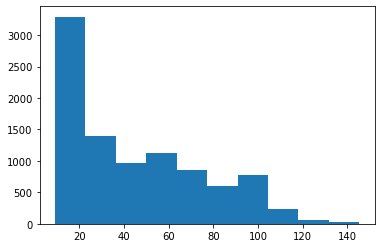

In [26]:
plt.hist(data['Price'])
plt.show()  

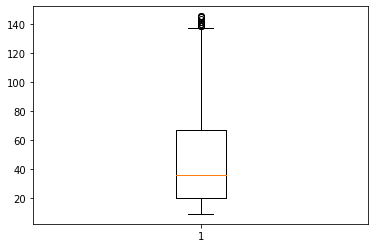

In [27]:
plt.boxplot(data['Price']) 
plt.show() 

In [28]:
data.describe() 

,Price
count,9345.000000
mean,46.028511
std,29.505983
min,9.060000
25%,20.000000
50%,36.060000
75%,66.900000
max,145.310000


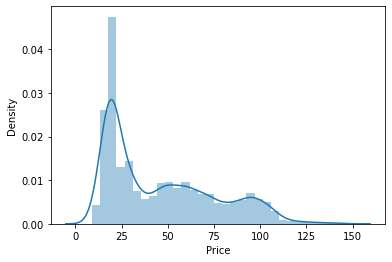

In [29]:
sns.distplot(data['Price']) 
plt.show() 

In [30]:
Q1 = np.percentile(data,25,interpolation= 'midpoint')
Q1 

20.0

In [31]:
Q3 = np.percentile(data,75,interpolation= 'midpoint') 
Q3 

66.9

In [32]:
IQR = Q3 - Q1 
IQR 

46.900000000000006

In [33]:
Q3+1.5*IQR #Upper extreme  

137.25

In [34]:
Q1-1.5*IQR #Lower extreme 

-50.35000000000001

In [35]:
upper = np.where(data > (Q3+1.5*IQR)) 
upper 
#Observations which are lying above the upper extreme point 

(array([5659, 5673, 5674, 5675, 5676, 5677, 5678, 5679, 5682, 5683, 5684,
        5685], dtype=int64),
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int64))

In [36]:
lower = np.where(data < (Q1-1.5*IQR)) 
lower
#Observations which are lying below the lower extreme point 

(array([], dtype=int64), array([], dtype=int64))

## Removing outliers

In [37]:
data2=data.drop(data.index[[5659, 5673, 5674, 5675, 5676, 5677, 5678, 5679, 5682, 5683, 5684,5685]],axis=0) 
data2 

,Price
Date,
02-01-1986,25.56
03-01-1986,26.00
06-01-1986,26.53
07-01-1986,25.85
08-01-1986,25.87
...,...
15-12-2022,76.11
16-12-2022,74.29
19-12-2022,75.19


In [38]:
data2.describe() 

,Price
count,9333.000000
mean,45.905668
std,29.325105
min,9.060000
25%,19.990000
50%,35.980000
75%,66.730000
max,136.910000


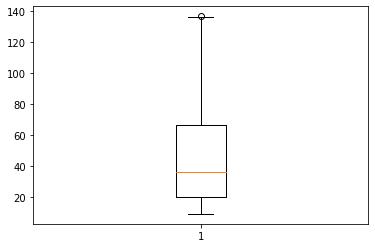

In [39]:
plt.boxplot(data2['Price']) 
plt.show() 

In [40]:
print(np.where(data2>=136.91)) 

(array([5662], dtype=int64), array([0], dtype=int64))


In [41]:
data3=data2.drop(data2.index[[5662]],axis=0) 
data3 

,Price
Date,
02-01-1986,25.56
03-01-1986,26.00
06-01-1986,26.53
07-01-1986,25.85
08-01-1986,25.87
...,...
15-12-2022,76.11
16-12-2022,74.29
19-12-2022,75.19


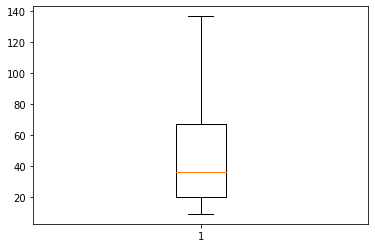

In [42]:
plt.boxplot(data3['Price']) 
plt.show() 

Now our data is free from outliers.

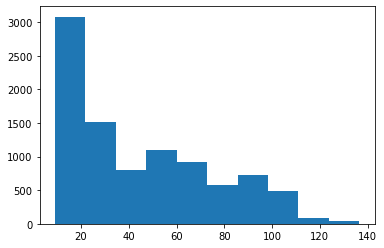

In [43]:
plt.hist(data3['Price'])
plt.show() 

In [44]:
data3.describe() 

,Price
count,9332.000000
mean,45.895916
std,29.311539
min,9.060000
25%,19.990000
50%,35.975000
75%,66.730000
max,136.540000


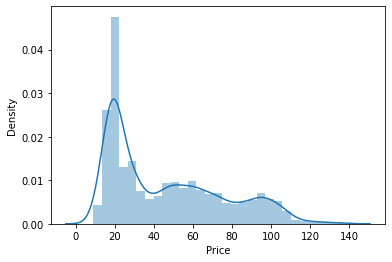

In [45]:
sns.distplot(data3['Price']) 
plt.show() 

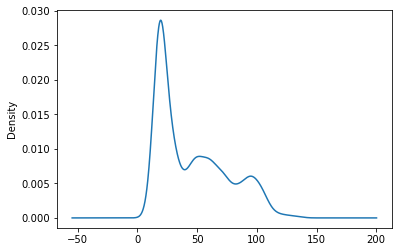

In [46]:
data3['Price'].plot(kind='kde') 
plt.show() 

In [47]:
data4=data3.reset_index() 
data4 

,Date,Price
0,02-01-1986,25.56
1,03-01-1986,26.00
2,06-01-1986,26.53
3,07-01-1986,25.85
4,08-01-1986,25.87
...,...,...
9327,15-12-2022,76.11
9328,16-12-2022,74.29
9329,19-12-2022,75.19
9330,20-12-2022,76.09


In [48]:
data4.dtypes 

Date      object
Price    float64
dtype: object

In [49]:
data4['Date']=pd.to_datetime(data4.Date) 
data4 

,Date,Price
0,1986-02-01,25.56
1,1986-03-01,26.00
2,1986-06-01,26.53
3,1986-07-01,25.85
4,1986-08-01,25.87
...,...,...
9327,2022-12-15,76.11
9328,2022-12-16,74.29
9329,2022-12-19,75.19
9330,2022-12-20,76.09


In [50]:
data4.dtypes 

Date     datetime64[ns]
Price           float64
dtype: object

In [51]:
data4["Date"] = pd.to_datetime(data4.Date,format="%b-%y")
data4["Month"] = data4.Date.dt.strftime("%b") # month extraction
data4["Year"] = data4.Date.dt.strftime("%Y") # year extraction
data4 

,Date,Price,Month,Year
0,1986-02-01,25.56,Feb,1986
1,1986-03-01,26.00,Mar,1986
2,1986-06-01,26.53,Jun,1986
3,1986-07-01,25.85,Jul,1986
4,1986-08-01,25.87,Aug,1986
...,...,...,...,...
9327,2022-12-15,76.11,Dec,2022
9328,2022-12-16,74.29,Dec,2022
9329,2022-12-19,75.19,Dec,2022
9330,2022-12-20,76.09,Dec,2022


## Heatmap

<AxesSubplot:xlabel='Month', ylabel='Year'>

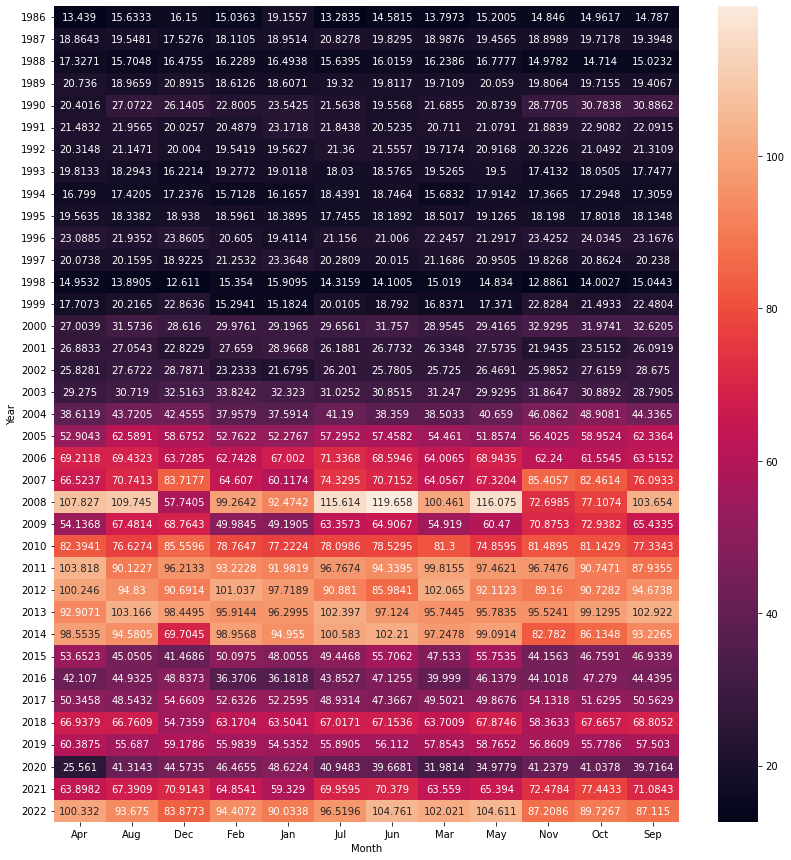

In [52]:
plt.figure(figsize=(14,15))
heatmap = pd.pivot_table(data=data4,values="Price",index="Year",columns="Month",aggfunc="mean",fill_value=0)
sns.heatmap(heatmap,annot=True,fmt="g") 

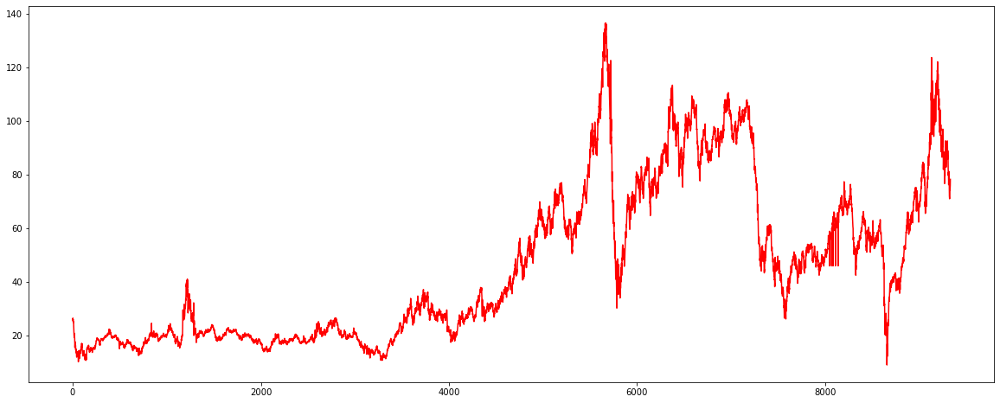

In [53]:
data4['Price'].plot(figsize=(20, 8),color='red')
plt.show() 

<AxesSubplot:>

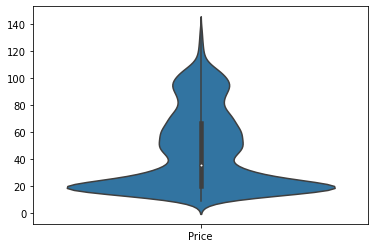

In [54]:
sns.violinplot(X='Date', Y='Price', data=data4) 

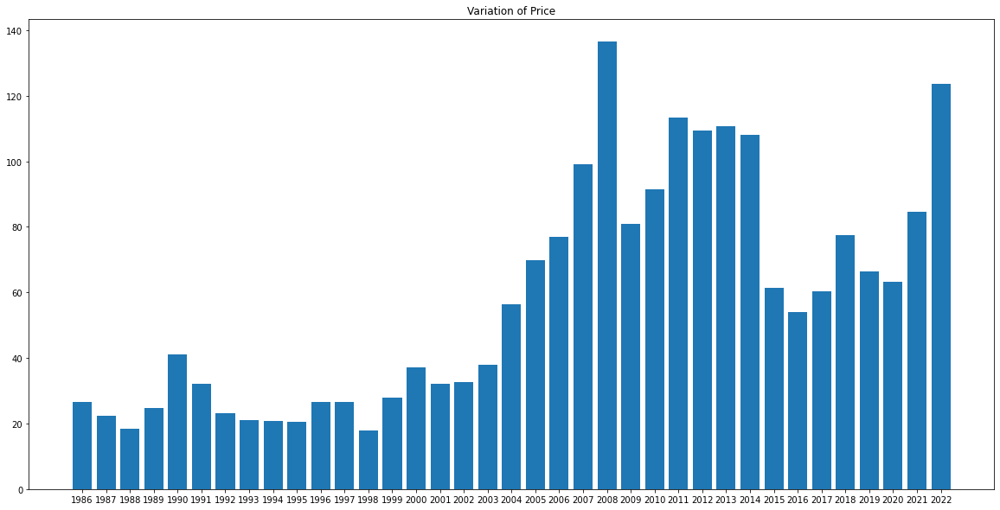

In [55]:
plt.figure(figsize=(20,10))
x=data4['Year']
y=data4['Price']
plt.bar(x,y)
plt.title('Variation of Price')
plt.show() 

<AxesSubplot:xlabel='Year', ylabel='Price'>

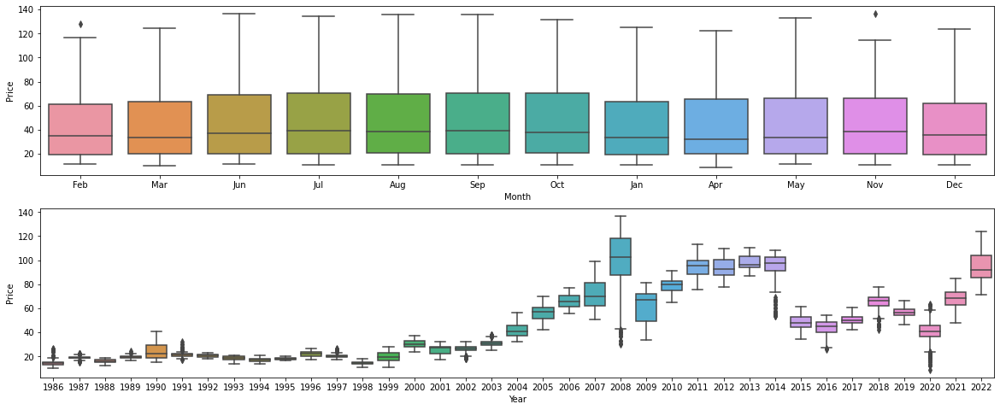

In [56]:
plt.figure(figsize= (20,8))
plt.subplot(211)
sns.boxplot(x="Month", y="Price", data= data4)
plt.subplot(212)
sns.boxplot(x="Year", y= "Price", data=data4) 

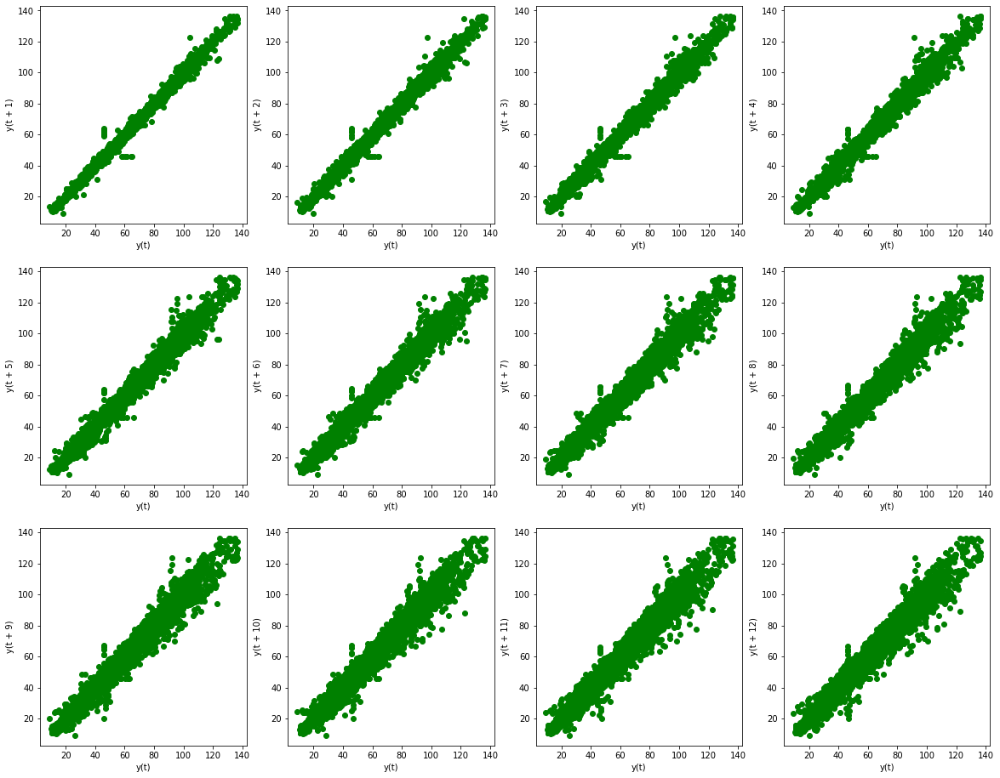

In [57]:
ig, axes = plt.subplots(figsize=(20,16), ncols=4, nrows=3)

lag_plot(data4.Price, lag=1, c = ['green'][0], ax=axes[0,0])
lag_plot(data4.Price, lag=2, c = ['green'][0], ax=axes[0,1])
lag_plot(data4.Price, lag=3, c = ['green'][0], ax=axes[0,2])
lag_plot(data4.Price, lag=4, c = ['green'][0], ax=axes[0,3])
lag_plot(data4.Price, lag=5, c = ['green'][0], ax=axes[1,0])
lag_plot(data4.Price, lag=6, c = ['green'][0], ax=axes[1,1])
lag_plot(data4.Price, lag=7, c = ['green'][0], ax=axes[1,2])
lag_plot(data4.Price, lag=8, c = ['green'][0], ax=axes[1,3])
lag_plot(data4.Price, lag=9, c = ['green'][0], ax=axes[2,0])
lag_plot(data4.Price, lag=10, c = ['green'][0], ax=axes[2,1])
lag_plot(data4.Price, lag=11, c = ['green'][0], ax=axes[2,2])
lag_plot(data4.Price, lag=12, c = ['green'][0], ax=axes[2,3])

plt.show() 

From the above lagplots, we can conclude that the data is having positive correlation with its lags.

## Time Series Decomposition

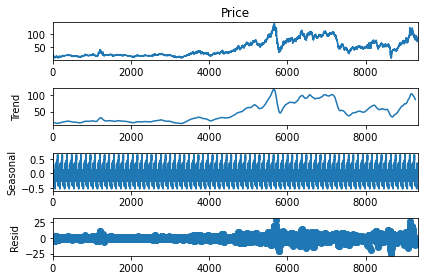

In [58]:
decomposition_ts_add = sm.tsa.seasonal_decompose(data4['Price'], model='additive',period=120)
fig = decomposition_ts_add.plot()
plt.show() 

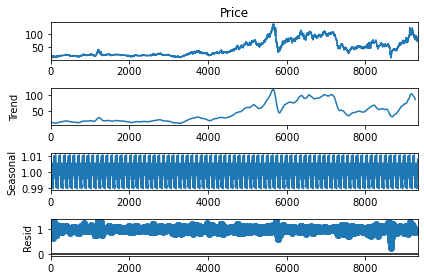

In [59]:
decomposition_ts_mult = sm.tsa.seasonal_decompose(data4['Price'], model='multiplicative',period=120)
fig = decomposition_ts_mult.plot()
plt.show() 

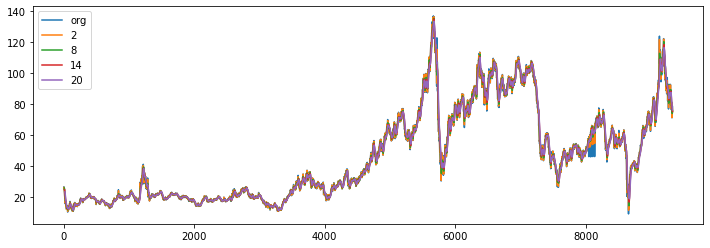

In [60]:
plt.figure(figsize=(12,4))
data4.Price.plot(label="org")
for i in range (2,24,6):
    data4["Price"].rolling(i).mean().plot(label=str(i))
plt.legend(loc="best")     

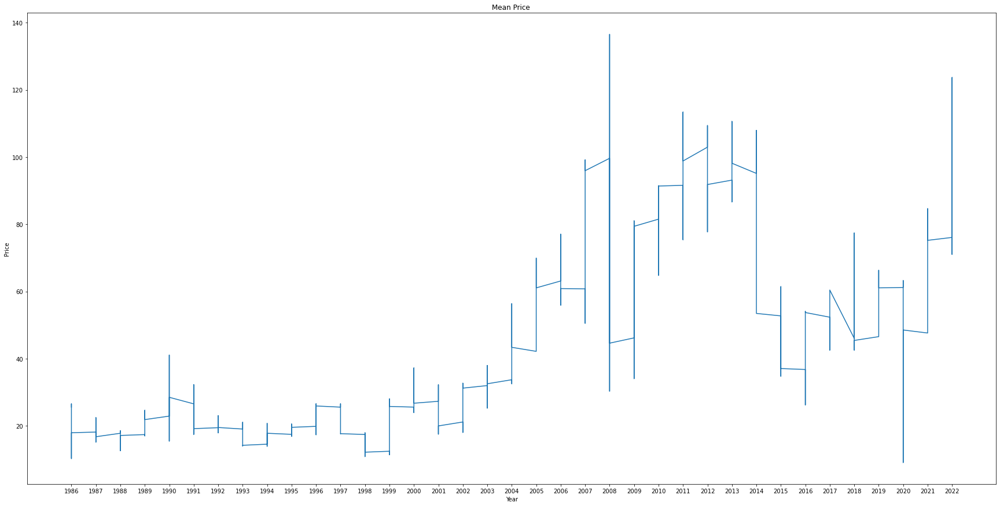

In [61]:
## Time series smoothing  (Stationarity of time series)
plt.figure(figsize=(30,15))
plt.plot(data4.Year,data4.Price)
plt.title("Mean Price ")
plt.xlabel("Year")
plt.ylabel("Price")
plt.show() 
timeseries = data4.loc[:,["Year","Price"]]  ## creating timeseries 
timeseries.index = timeseries.Year
ts = timeseries.drop("Year",axis=1)   

In [62]:
data3

,Price
Date,
02-01-1986,25.56
03-01-1986,26.00
06-01-1986,26.53
07-01-1986,25.85
08-01-1986,25.87
...,...
15-12-2022,76.11
16-12-2022,74.29
19-12-2022,75.19


## Adfuller test (To check for the stationarity of our data)

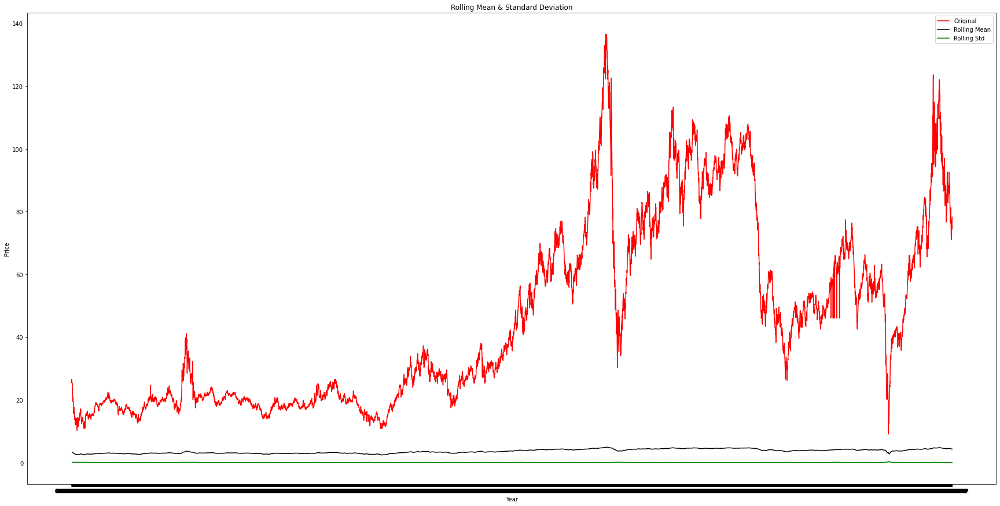

Test statistic: -2.3318047632916876
p-value: 0.16191534495545917
Critical Values: {'1%': -3.431053874661101, '5%': -2.861851068123899, '10%': -2.566935576484507}


In [63]:
#Nul hypothesis = non-stationary; Alternate hypothesis = Stationary
#if p-value > 0.05 - accept null hypothesis(data is non stationary) else accept alternate hypothesis(data is stationary)
def check_adfuller(data3):
    result = adfuller(data3,autolag='AIC')
    print('Test statistic:',result[0])
    print('p-value:',result[1])
    print('Critical Values:',result[4])
def check_mean_std(data3):
    data3_log = np.log(data3)
    moving_avg = data3_log.rolling(12).mean()
    moving_std = data3_log.rolling(12).std()
    plt.figure(figsize=(30,15))
    orig = plt.plot(data3,color = 'red',label = 'Original')
    mean = plt.plot(moving_avg, color = 'black',label= 'Rolling Mean')
    std = plt.plot(moving_std,color = 'green',label= 'Rolling Std')
    plt.xlabel("Year")
    plt.ylabel("Price")
    plt.title('Rolling Mean & Standard Deviation')
    plt.legend()
    plt.show()
check_mean_std(data3)
check_adfuller(data3.Price) 

Here, the p value is greater than 0.05 (Critical value).
So, Accept Null hypothesis i.e., The data is non stationary. 

## Applying tranformations to convert non-stationary data to stationary data

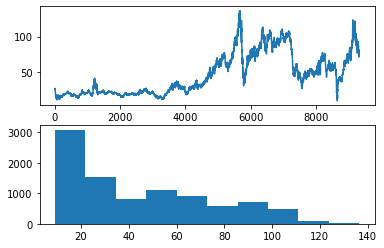

In [64]:
# Linear transform

dataframe_linear = DataFrame(data3.values)
dataframe_linear.columns = ['Price']

# line plot
plt.subplot(211)
plt.plot(dataframe_linear['Price'])
# histogram
plt.subplot(212)
plt.hist(dataframe_linear['Price'])
plt.show() 

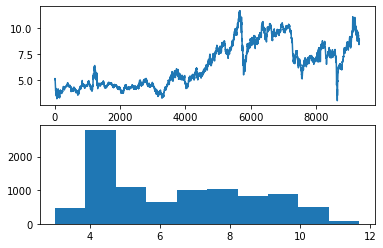

In [65]:
# Square root transform

dataframe_sqrt = DataFrame(data3.values)
dataframe_sqrt.columns = ['Price']
dataframe_sqrt['Price'] = sqrt (dataframe_sqrt['Price']) 

# line plot
plt.subplot(211)
plt.plot(dataframe_sqrt['Price'])
# histogram
plt.subplot(212)
plt.hist(dataframe_sqrt['Price'])
plt.show()  

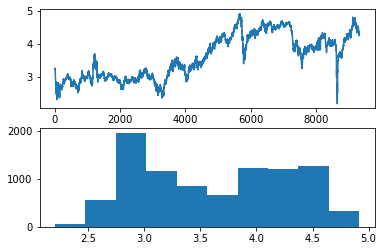

In [66]:
# Log transform

dataframe_log = DataFrame(data3.values)
dataframe_log.columns = ['Price']
dataframe_log['Price'] = log(dataframe_log['Price'])

# line plot
plt.subplot(211)
plt.plot(dataframe_log['Price'])
# histogram
plt.subplot(212)
plt.hist(dataframe_log['Price'])
plt.show() 

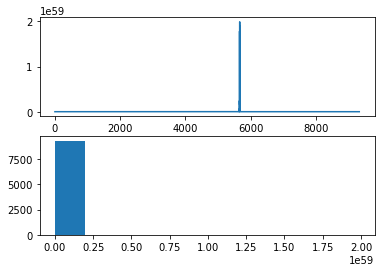

In [67]:
#Exponential transform

dataframe_exp = DataFrame(data3.values)
dataframe_exp.columns = ['Price']
dataframe_exp['Price'] = exp(dataframe_exp['Price'])

# line plot
plt.subplot(211)
plt.plot(dataframe_exp['Price'])
# histogram
plt.subplot(212)
plt.hist(dataframe_exp['Price'])
plt.show() 

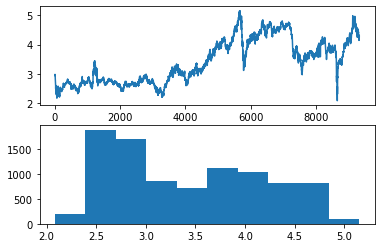

In [68]:
# Cube root transform

dataframe_cbrt = DataFrame(data3.values)
dataframe_cbrt.columns = ['Price']
dataframe_cbrt['Price'] = cbrt(dataframe_cbrt['Price']) 

# line plot
plt.subplot(211)
plt.plot(dataframe_cbrt['Price'])
# histogram
plt.subplot(212)
plt.hist(dataframe_cbrt['Price'])
plt.show()

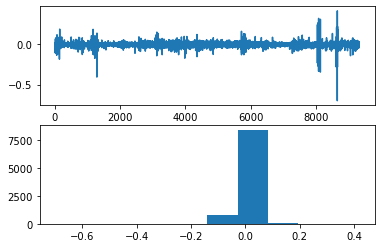

In [69]:
# Log differencing transform

dataframe_log_diff = DataFrame(data3.values)
dataframe_log_diff.columns = ['Price']
dataframe_log_diff['Price'] = log(dataframe_log_diff['Price']) - log(dataframe_log_diff['Price']).shift(1) 

# line plot
plt.subplot(211)
plt.plot(dataframe_log_diff['Price'])
# histogram
plt.subplot(212)
plt.hist(dataframe_log_diff['Price'])
plt.show() 

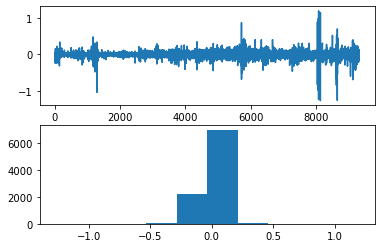

In [70]:
# Square root differencing transform

dataframe_sqrt_diff = DataFrame(data3.values)
dataframe_sqrt_diff.columns = ['Price']
dataframe_sqrt_diff['Price'] = sqrt(dataframe_sqrt_diff['Price']) - sqrt(dataframe_sqrt_diff['Price']).shift(1)  

# line plot
plt.subplot(211)
plt.plot(dataframe_sqrt_diff['Price'])
# histogram
plt.subplot(212)
plt.hist(dataframe_sqrt_diff['Price'])
plt.show() 

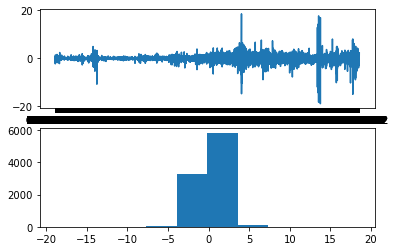

In [71]:
# First order differencing

dataframe_first_diff = data3.diff()[1:]
dataframe_first_diff

# line plot
plt.subplot(211)
plt.plot(dataframe_first_diff['Price'])
# histogram
plt.subplot(212)
plt.hist(dataframe_first_diff['Price'])
plt.show() 

From the above transformations we can conclude that the first order differencing makes our data more stationary.

In [72]:
dataframe_first_diff 

,Price
Date,
03-01-1986,0.44
06-01-1986,0.53
07-01-1986,-0.68
08-01-1986,0.02
09-01-1986,0.16
...,...
15-12-2022,-1.17
16-12-2022,-1.82
19-12-2022,0.90


## ACF and PACF plots

### ACF and PACF plots before applying transformations

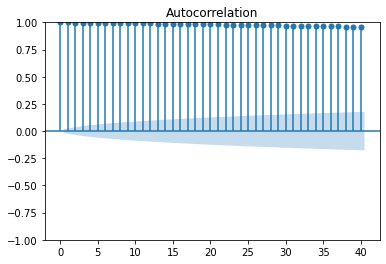

In [73]:
plot_acf(data3['Price'])
plt.show() 

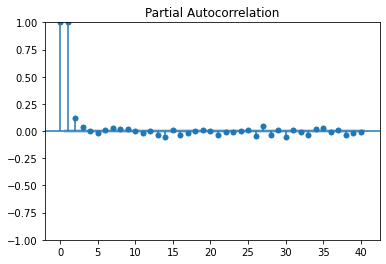

In [74]:
plot_pacf(data3['Price'])
plt.show() 

### ACF and PACF plots after applying transformations

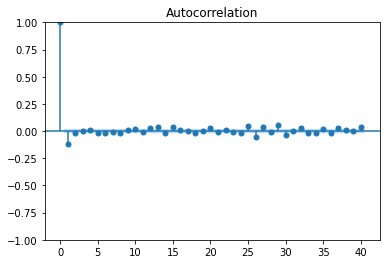

In [75]:
plot_acf(dataframe_first_diff['Price'])
plt.show() 

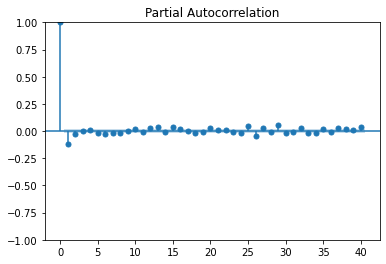

In [76]:
plot_pacf(dataframe_first_diff['Price'])
plt.show() 

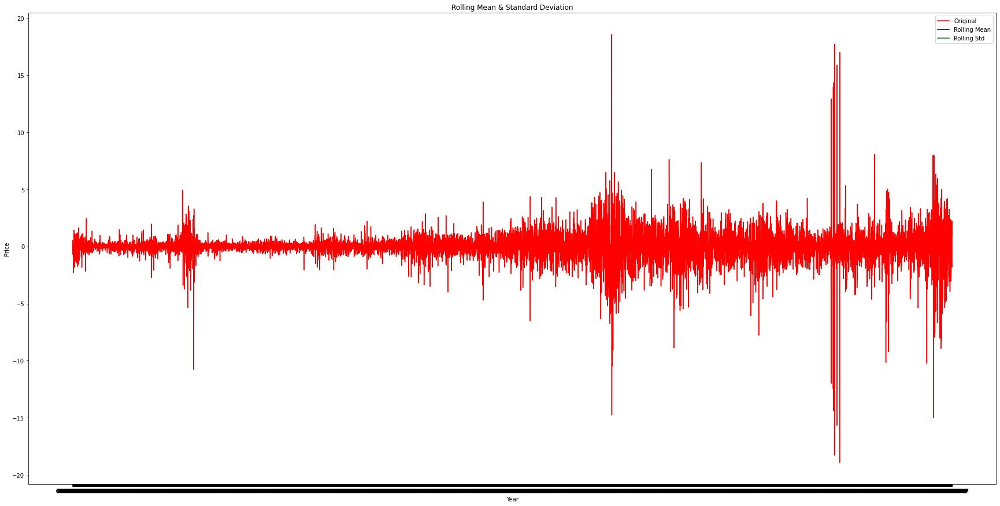

Test statistic: -13.864850158434743
p-value: 6.626515507284801e-26
Critical Values: {'1%': -3.431053874661101, '5%': -2.861851068123899, '10%': -2.566935576484507}


In [77]:
#Nul hypothesis = non-stationary; Alternate hypothesis = Stationary
#if p-value > 0.05 - accept null hypothesis(data is non stationary) else accept alternate hypothesis(data is stationary)
def check_adfuller(dataframe_first_diff):
    result = adfuller(dataframe_first_diff,autolag='AIC')
    print('Test statistic:',result[0])
    print('p-value:',result[1])
    print('Critical Values:',result[4])
def check_mean_std(dataframe_first_diff):
    dataframe_first_diff_log = np.log(dataframe_first_diff)
    moving_avg1 = dataframe_first_diff_log.rolling(12).mean()
    moving_std1 = dataframe_first_diff_log.rolling(12).std()
    plt.figure(figsize=(30,15))
    orig = plt.plot(dataframe_first_diff, color = 'red',label = 'Original')
    mean = plt.plot(moving_avg1, color = 'black',label= 'Rolling Mean')
    std = plt.plot(moving_std1, color = 'green',label= 'Rolling Std')
    plt.xlabel("Year")
    plt.ylabel("Price")
    plt.title('Rolling Mean & Standard Deviation')
    plt.legend()
    plt.show()
check_mean_std(dataframe_first_diff)
check_adfuller(dataframe_first_diff.Price) 

Here, the p value is less than 0.05 (Critical value).
So, Accept Alternate hypothesis i.e., The data is stationary.

In [78]:
#data before applying differencing #non stationary
data3 

,Price
Date,
02-01-1986,25.56
03-01-1986,26.00
06-01-1986,26.53
07-01-1986,25.85
08-01-1986,25.87
...,...
15-12-2022,76.11
16-12-2022,74.29
19-12-2022,75.19


In [79]:
#data after applying differencing #stationary
data5 = dataframe_first_diff.copy()
data5 

,Price
Date,
03-01-1986,0.44
06-01-1986,0.53
07-01-1986,-0.68
08-01-1986,0.02
09-01-1986,0.16
...,...
15-12-2022,-1.17
16-12-2022,-1.82
19-12-2022,0.90


In [80]:
data4 

,Date,Price,Month,Year
0,1986-02-01,25.56,Feb,1986
1,1986-03-01,26.00,Mar,1986
2,1986-06-01,26.53,Jun,1986
3,1986-07-01,25.85,Jul,1986
4,1986-08-01,25.87,Aug,1986
...,...,...,...,...
9327,2022-12-15,76.11,Dec,2022
9328,2022-12-16,74.29,Dec,2022
9329,2022-12-19,75.19,Dec,2022
9330,2022-12-20,76.09,Dec,2022


In [81]:
data6= data4.copy() 
data6 

,Date,Price,Month,Year
0,1986-02-01,25.56,Feb,1986
1,1986-03-01,26.00,Mar,1986
2,1986-06-01,26.53,Jun,1986
3,1986-07-01,25.85,Jul,1986
4,1986-08-01,25.87,Aug,1986
...,...,...,...,...
9327,2022-12-15,76.11,Dec,2022
9328,2022-12-16,74.29,Dec,2022
9329,2022-12-19,75.19,Dec,2022
9330,2022-12-20,76.09,Dec,2022


In [82]:
X =pd.DataFrame({"t":range(1,9333)})
X 

,t
0,1
1,2
2,3
3,4
4,5
...,...
9327,9328
9328,9329
9329,9330
9330,9331


In [83]:
X['t_square'] = X['t']**2
X 

,t,t_square
0,1,1
1,2,4
2,3,9
3,4,16
4,5,25
...,...,...
9327,9328,87011584
9328,9329,87030241
9329,9330,87048900
9330,9331,87067561


In [84]:
data7=data6.drop('Year', axis=1)
data7 

,Date,Price,Month
0,1986-02-01,25.56,Feb
1,1986-03-01,26.00,Mar
2,1986-06-01,26.53,Jun
3,1986-07-01,25.85,Jul
4,1986-08-01,25.87,Aug
...,...,...,...
9327,2022-12-15,76.11,Dec
9328,2022-12-16,74.29,Dec
9329,2022-12-19,75.19,Dec
9330,2022-12-20,76.09,Dec


In [85]:
data7['log_Price'] = np.log(data7['Price'])
data7 

,Date,Price,Month,log_Price
0,1986-02-01,25.56,Feb,3.241029
1,1986-03-01,26.00,Mar,3.258097
2,1986-06-01,26.53,Jun,3.278276
3,1986-07-01,25.85,Jul,3.252311
4,1986-08-01,25.87,Aug,3.253084
...,...,...,...,...
9327,2022-12-15,76.11,Dec,4.332180
9328,2022-12-16,74.29,Dec,4.307976
9329,2022-12-19,75.19,Dec,4.320018
9330,2022-12-20,76.09,Dec,4.331917


In [86]:
data8=pd.get_dummies(data7, columns=['Month']) 
data8  

,Date,Price,log_Price,Month_Apr,Month_Aug,Month_Dec,Month_Feb,Month_Jan,Month_Jul,Month_Jun,Month_Mar,Month_May,Month_Nov,Month_Oct,Month_Sep
0,1986-02-01,25.56,3.241029,0,0,0,1,0,0,0,0,0,0,0,0
1,1986-03-01,26.00,3.258097,0,0,0,0,0,0,0,1,0,0,0,0
2,1986-06-01,26.53,3.278276,0,0,0,0,0,0,1,0,0,0,0,0
3,1986-07-01,25.85,3.252311,0,0,0,0,0,1,0,0,0,0,0,0
4,1986-08-01,25.87,3.253084,0,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9327,2022-12-15,76.11,4.332180,0,0,1,0,0,0,0,0,0,0,0,0
9328,2022-12-16,74.29,4.307976,0,0,1,0,0,0,0,0,0,0,0,0
9329,2022-12-19,75.19,4.320018,0,0,1,0,0,0,0,0,0,0,0,0
9330,2022-12-20,76.09,4.331917,0,0,1,0,0,0,0,0,0,0,0,0


In [87]:
data9=pd.concat([data8, X], axis=1) 
data9 

,Date,Price,log_Price,Month_Apr,Month_Aug,Month_Dec,Month_Feb,Month_Jan,Month_Jul,Month_Jun,Month_Mar,Month_May,Month_Nov,Month_Oct,Month_Sep,t,t_square
0,1986-02-01,25.56,3.241029,0,0,0,1,0,0,0,0,0,0,0,0,1,1
1,1986-03-01,26.00,3.258097,0,0,0,0,0,0,0,1,0,0,0,0,2,4
2,1986-06-01,26.53,3.278276,0,0,0,0,0,0,1,0,0,0,0,0,3,9
3,1986-07-01,25.85,3.252311,0,0,0,0,0,1,0,0,0,0,0,0,4,16
4,1986-08-01,25.87,3.253084,0,1,0,0,0,0,0,0,0,0,0,0,5,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9327,2022-12-15,76.11,4.332180,0,0,1,0,0,0,0,0,0,0,0,0,9328,87011584
9328,2022-12-16,74.29,4.307976,0,0,1,0,0,0,0,0,0,0,0,0,9329,87030241
9329,2022-12-19,75.19,4.320018,0,0,1,0,0,0,0,0,0,0,0,0,9330,87048900
9330,2022-12-20,76.09,4.331917,0,0,1,0,0,0,0,0,0,0,0,0,9331,87067561


## Partitioning the data

In [88]:
Train = data9.head(6160) #66%
Test = data9.tail(3172) #33% 

In [89]:
Train  

,Date,Price,log_Price,Month_Apr,Month_Aug,Month_Dec,Month_Feb,Month_Jan,Month_Jul,Month_Jun,Month_Mar,Month_May,Month_Nov,Month_Oct,Month_Sep,t,t_square
0,1986-02-01,25.56,3.241029,0,0,0,1,0,0,0,0,0,0,0,0,1,1
1,1986-03-01,26.00,3.258097,0,0,0,0,0,0,0,1,0,0,0,0,2,4
2,1986-06-01,26.53,3.278276,0,0,0,0,0,0,1,0,0,0,0,0,3,9
3,1986-07-01,25.85,3.252311,0,0,0,0,0,1,0,0,0,0,0,0,4,16
4,1986-08-01,25.87,3.253084,0,1,0,0,0,0,0,0,0,0,0,0,5,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6155,2010-06-15,76.84,4.341725,0,0,0,0,0,0,1,0,0,0,0,0,6156,37896336
6156,2010-06-16,77.67,4.352469,0,0,0,0,0,0,1,0,0,0,0,0,6157,37908649
6157,2010-06-17,76.82,4.341465,0,0,0,0,0,0,1,0,0,0,0,0,6158,37920964
6158,2010-06-18,77.18,4.346140,0,0,0,0,0,0,1,0,0,0,0,0,6159,37933281


In [90]:
Test 

,Date,Price,log_Price,Month_Apr,Month_Aug,Month_Dec,Month_Feb,Month_Jan,Month_Jul,Month_Jun,Month_Mar,Month_May,Month_Nov,Month_Oct,Month_Sep,t,t_square
6160,2010-06-22,77.15,4.345752,0,0,0,0,0,0,1,0,0,0,0,0,6161,37957921
6161,2010-06-23,75.90,4.329417,0,0,0,0,0,0,1,0,0,0,0,0,6162,37970244
6162,2010-06-24,75.96,4.330207,0,0,0,0,0,0,1,0,0,0,0,0,6163,37982569
6163,2010-06-25,78.45,4.362461,0,0,0,0,0,0,1,0,0,0,0,0,6164,37994896
6164,2010-06-28,78.26,4.360037,0,0,0,0,0,0,1,0,0,0,0,0,6165,38007225
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9327,2022-12-15,76.11,4.332180,0,0,1,0,0,0,0,0,0,0,0,0,9328,87011584
9328,2022-12-16,74.29,4.307976,0,0,1,0,0,0,0,0,0,0,0,0,9329,87030241
9329,2022-12-19,75.19,4.320018,0,0,1,0,0,0,0,0,0,0,0,0,9330,87048900
9330,2022-12-20,76.09,4.331917,0,0,1,0,0,0,0,0,0,0,0,0,9331,87067561


In [91]:
def MAPE(pred,org):
    temp = np.abs((pred-org)/org)*100
    return np.mean(temp) 

## Model Building

## Model Based Methods

### Linear

In [92]:
linear_model = smf.ols('Price~t',data=Train).fit()
pred_linear_model = pd.Series(linear_model.predict(pd.DataFrame(Test)))
pred_linear_model 

6160    63.522996
6161    63.532889
6162    63.542783
6163    63.552677
6164    63.562570
          ...    
9327    94.855951
9328    94.865845
9329    94.875739
9330    94.885632
9331    94.895526
Length: 3172, dtype: float64

In [93]:
linear_model.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.571
Model:                            OLS   Adj. R-squared:                  0.571
Method:                 Least Squares   F-statistic:                     8182.
Date:                Thu, 19 Jan 2023   Prob (F-statistic):               0.00
Time:                        16:25:44   Log-Likelihood:                -25529.
No. Observations:                6160   AIC:                         5.106e+04
Df Residuals:                    6158   BIC:                         5.108e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.5687      0.389      6.603      0.000       1.806       3.331
t              0.0099      0.000     90.457      0.000       0.010       0.010
==============================================================================
Omnibus:                     1695.023   Durbin-Watson:                   0.005
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5775.264
Skew:                           1.369   Prob(JB):                         0.00
Kurtosis:                       6.873   Cond. No.                     7.11e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.11e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [94]:
MAPE_linear=MAPE(pred_linear_model,Test.Price) 
MAPE_linear 

48.06678533430291

In [95]:
rmse_linear_model= np.sqrt(np.mean((np.array(Test['Price'])-np.array(pred_linear_model))**2)) 
rmse_linear_model 

29.183139597124303

### Exponential

In [96]:
exp_model = smf.ols('log_Price~t',data=Train).fit()
pred_exp_model = pd.Series(exp_model.predict(pd.DataFrame(Test)))
pred_exp_model 

6160    4.112684
6161    4.112943
6162    4.113201
6163    4.113460
6164    4.113719
          ...   
9327    4.932324
9328    4.932582
9329    4.932841
9330    4.933100
9331    4.933359
Length: 3172, dtype: float64

In [97]:
exp_model.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_Price   R-squared:                       0.665
Model:                            OLS   Adj. R-squared:                  0.665
Method:                 Least Squares   F-statistic:                 1.223e+04
Date:                Thu, 19 Jan 2023   Prob (F-statistic):               0.00
Time:                        16:25:44   Log-Likelihood:                -1847.0
No. Observations:                6160   AIC:                             3698.
Df Residuals:                    6158   BIC:                             3711.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.5182      0.008    302.513      0.000       2.502       2.534
t              0.0003   2.34e-06    110.587      0.000       0.000       0.000
==============================================================================
Omnibus:                       15.574   Durbin-Watson:                   0.007
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               16.710
Skew:                          -0.088   Prob(JB):                     0.000235
Kurtosis:                       3.185   Cond. No.                     7.11e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.11e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [98]:
MAPE_exp=MAPE(pred_exp_model,Test.Price) 
MAPE_exp 

92.69898002609881

In [99]:
rmse_exp_model = np.sqrt(np.mean((np.array(Test['Price'])-np.array(np.exp(pred_exp_model)))**2))
rmse_exp_model 

44.20679172561549

### Quadratic 

In [100]:
quad_model = smf.ols('Price~t+t_square',data=Train).fit()
pred_quad_model = pd.Series(quad_model.predict(Test))
pred_quad_model 

6160     86.880845
6161     86.913486
6162     86.946134
6163     86.978790
6164     87.011453
           ...    
9327    227.269357
9328    227.325381
9329    227.381411
9330    227.437450
9331    227.493495
Length: 3172, dtype: float64

In [101]:
quad_model.summary()  

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.772
Model:                            OLS   Adj. R-squared:                  0.771
Method:                 Least Squares   F-statistic:                 1.040e+04
Date:                Thu, 19 Jan 2023   Prob (F-statistic):               0.00
Time:                        16:25:44   Log-Likelihood:                -23585.
No. Observations:                6160   AIC:                         4.718e+04
Df Residuals:                    6157   BIC:                         4.720e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     25.9265      0.426     60.895      0.000      25.092      26.761
t             -0.0129      0.000    -40.260      0.000      -0.013      -0.012
t_square    3.692e-06   5.02e-08     73.593      0.000    3.59e-06    3.79e-06
==============================================================================
Omnibus:                     2087.618   Durbin-Watson:                   0.009
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            16541.656
Skew:                           1.401   Prob(JB):                         0.00
Kurtosis:                      10.523   Cond. No.                     5.09e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.09e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [102]:
MAPE_quad=MAPE(pred_quad_model,Test.Price)
MAPE_quad 

150.72951696947038

In [103]:
rmse_quad_model = np.sqrt(np.mean((np.array(Test['Price'])-np.array(np.exp(pred_quad_model)))**2))
rmse_quad_model

3.4355980540938745e+97

### Additive seasonality 

In [104]:
add_sea_model = smf.ols('Price~Month_Jan+Month_Feb+Month_Mar+Month_Apr+Month_May+Month_Jun+Month_Jul+Month_Aug+Month_Sep+Month_Oct+Month_Nov+Month_Dec',data=Train).fit()
pred_add_sea_model = pd.Series(add_sea_model.predict(Test))
pred_add_sea_model 

6160    33.132812
6161    33.132812
6162    33.132812
6163    33.132812
6164    33.132812
          ...    
9327    32.331055
9328    32.331055
9329    32.331055
9330    32.331055
9331    32.331055
Length: 3172, dtype: float64

In [105]:
add_sea_model.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.6289
Date:                Thu, 19 Jan 2023   Prob (F-statistic):              0.806
Time:                        16:25:44   Log-Likelihood:                -28129.
No. Observations:                6160   AIC:                         5.628e+04
Df Residuals:                    6148   BIC:                         5.636e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -5.624e+12   5.28e+13     -0.106      0.915   -1.09e+14    9.79e+13
Month_Jan   5.624e+12   5.28e+13      0.106      0.915   -9.79e+13    1.09e+14
Month_Feb   5.624e+12   5.28e+13      0.106      0.915   -9.79e+13    1.09e+14
Month_Mar   5.624e+12   5.28e+13      0.106      0.915   -9.79e+13    1.09e+14
Month_Apr   5.624e+12   5.28e+13      0.106      0.915   -9.79e+13    1.09e+14
Month_May   5.624e+12   5.28e+13      0.106      0.915   -9.79e+13    1.09e+14
Month_Jun   5.624e+12   5.28e+13      0.106      0.915   -9.79e+13    1.09e+14
Month_Jul   5.624e+12   5.28e+13      0.106      0.915   -9.79e+13    1.09e+14
Month_Aug   5.624e+12   5.28e+13      0.106      0.915   -9.79e+13    1.09e+14
Month_Sep   5.624e+12   5.28e+13      0.106      0.915   -9.79e+13    1.09e+14
Month_Oct   5.624e+12   5.28e+13      0.106      0.915   -9.79e+13    1.09e+14
Month_Nov   5.624e+12   5.28e+13      0.106      0.915   -9.79e+13    1.09e+14
Month_Dec   5.624e+12   5.28e+13      0.106      0.915   -9.79e+13    1.09e+14
==============================================================================
Omnibus:                     2010.077   Durbin-Watson:                   0.003
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5347.370
Skew:                           1.782   Prob(JB):                         0.00
Kurtosis:                       5.852   Cond. No.                     6.68e+14
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.5e-26. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [106]:
MAPE_add_sea=MAPE(pred_add_sea_model,Test.Price) 
MAPE_add_sea 

48.79758656316227

In [107]:
rmse_add_sea_model = np.sqrt(np.mean((np.array(Test['Price'])-np.array(pred_add_sea_model))**2))
rmse_add_sea_model 

44.2214473766003

### Additive Seasonality Quadratic

In [108]:
add_sea_quad_model = smf.ols('Price~t+t_square+Month_Jan+Month_Feb+Month_Mar+Month_Apr+Month_May+Month_Jun+Month_Jul+Month_Aug+Month_Sep+Month_Oct+Month_Nov+Month_Dec',data=Train).fit()
pred_add_sea_quad_model = pd.Series(add_sea_quad_model.predict(Test))
pred_add_sea_quad_model 

6160     87.396914
6161     87.429581
6162     87.462255
6163     87.494937
6164     87.527626
           ...    
9327    226.128494
9328    226.184570
9329    226.240653
9330    226.296744
9331    226.352843
Length: 3172, dtype: float64

In [109]:
add_sea_quad_model.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.773
Model:                            OLS   Adj. R-squared:                  0.772
Method:                 Least Squares   F-statistic:                     1609.
Date:                Thu, 19 Jan 2023   Prob (F-statistic):               0.00
Time:                        16:25:44   Log-Likelihood:                -23568.
No. Observations:                6160   AIC:                         4.716e+04
Df Residuals:                    6146   BIC:                         4.726e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     23.9414      0.392     61.022      0.000      23.172      24.710
t             -0.0129      0.000    -40.406      0.000      -0.014      -0.012
t_square    3.696e-06   5.01e-08     73.792      0.000     3.6e-06    3.79e-06
Month_Jan      0.9836      0.471      2.086      0.037       0.059       1.908
Month_Feb      0.9871      0.490      2.012      0.044       0.026       1.949
Month_Mar      1.3233      0.463      2.861      0.004       0.417       2.230
Month_Apr      1.7153      0.473      3.625      0.000       0.788       2.643
Month_May      2.2886      0.469      4.883      0.000       1.370       3.207
Month_Jun      2.5029      0.470      5.324      0.000       1.581       3.424
Month_Jul      2.8705      0.463      6.197      0.000       1.962       3.779
Month_Aug      3.4323      0.462      7.426      0.000       2.526       4.338
Month_Sep      3.0306      0.470      6.450      0.000       2.109       3.952
Month_Oct      2.2413      0.463      4.845      0.000       1.335       3.148
Month_Nov      1.8444      0.483      3.819      0.000       0.898       2.791
Month_Dec      0.7214      0.475      1.518      0.129      -0.210       1.653
==============================================================================
Omnibus:                     2073.362   Durbin-Watson:                   0.012
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            15896.390
Skew:                           1.401   Prob(JB):                         0.00
Kurtosis:                      10.354   Cond. No.                     9.78e+22
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.86e-28. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [110]:
MAPE_add_sea_quad=MAPE(pred_add_sea_quad_model,Test.Price) 
MAPE_add_sea_quad 

150.89806280772453

In [111]:
rmse_add_sea_quad_model = np.sqrt(np.mean((np.array(Test['Price'])-np.array(pred_add_sea_quad_model))**2))
rmse_add_sea_quad_model 

96.55195805654678

### Multiplicative Seasonality

In [112]:
mul_sea_model = smf.ols('log_Price~Month_Jan+Month_Feb+Month_Mar+Month_Apr+Month_May+Month_Jun+Month_Jul+Month_Aug+Month_Sep+Month_Oct+Month_Nov+Month_Dec',data = Train).fit()
pred_mult_sea_model = pd.Series(mul_sea_model.predict(Test))
pred_mult_sea_model 

6160    3.316895
6161    3.316895
6162    3.316895
6163    3.316895
6164    3.316895
          ...   
9327    3.450562
9328    3.450562
9329    3.450562
9330    3.450562
9331    3.450562
Length: 3172, dtype: float64

In [113]:
mul_sea_model.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_Price   R-squared:                      -0.007
Model:                            OLS   Adj. R-squared:                 -0.009
Method:                 Least Squares   F-statistic:                    -4.015
Date:                Thu, 19 Jan 2023   Prob (F-statistic):               1.00
Time:                        16:25:45   Log-Likelihood:                -5238.5
No. Observations:                6160   AIC:                         1.050e+04
Df Residuals:                    6148   BIC:                         1.058e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -1.096e+11   1.29e+12     -0.085      0.932   -2.63e+12    2.41e+12
Month_Jan   1.096e+11   1.29e+12      0.085      0.932   -2.41e+12    2.63e+12
Month_Feb   1.096e+11   1.29e+12      0.085      0.932   -2.41e+12    2.63e+12
Month_Mar   1.096e+11   1.29e+12      0.085      0.932   -2.41e+12    2.63e+12
Month_Apr   1.096e+11   1.29e+12      0.085      0.932   -2.41e+12    2.63e+12
Month_May   1.096e+11   1.29e+12      0.085      0.932   -2.41e+12    2.63e+12
Month_Jun   1.096e+11   1.29e+12      0.085      0.932   -2.41e+12    2.63e+12
Month_Jul   1.096e+11   1.29e+12      0.085      0.932   -2.41e+12    2.63e+12
Month_Aug   1.096e+11   1.29e+12      0.085      0.932   -2.41e+12    2.63e+12
Month_Sep   1.096e+11   1.29e+12      0.085      0.932   -2.41e+12    2.63e+12
Month_Oct   1.096e+11   1.29e+12      0.085      0.932   -2.41e+12    2.63e+12
Month_Nov   1.096e+11   1.29e+12      0.085      0.932   -2.41e+12    2.63e+12
Month_Dec   1.096e+11   1.29e+12      0.085      0.932   -2.41e+12    2.63e+12
==============================================================================
Omnibus:                      620.605   Durbin-Watson:                   0.009
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              806.378
Skew:                           0.876   Prob(JB):                    7.89e-176
Kurtosis:                       2.734   Cond. No.                     6.68e+14
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.5e-26. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [114]:
MAPE_mult_sea=MAPE(pred_mult_sea_model,Test.Price) 
MAPE_mult_sea 

94.65380054016134

In [115]:
rmse_mult_sea_model = np.sqrt(np.mean((np.array(Test['Price'])-np.array(np.exp(pred_mult_sea_model)))**2))
rmse_mult_sea_model 

48.55996431787199

### Multiplicative Additive Seasonality 

In [116]:
mult_add_sea_model = smf.ols('log_Price~t+Month_Jan+Month_Feb+Month_Mar+Month_Apr+Month_May+Month_Jun+Month_Jul+Month_Aug+Month_Sep+Month_Oct+Month_Nov+Month_Dec',data = Train).fit()
pred_mult_add_sea_model = pd.Series(mult_add_sea_model.predict(Test))
pred_mult_add_sea_model 

6160    4.114270
6161    4.114529
6162    4.114788
6163    4.115047
6164    4.115306
          ...   
9327    4.897675
9328    4.897934
9329    4.898192
9330    4.898451
9331    4.898710
Length: 3172, dtype: float64

In [117]:
mult_add_sea_model.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_Price   R-squared:                       0.666
Model:                            OLS   Adj. R-squared:                  0.665
Method:                 Least Squares   F-statistic:                     1021.
Date:                Thu, 19 Jan 2023   Prob (F-statistic):               0.00
Time:                        16:25:45   Log-Likelihood:                -1839.5
No. Observations:                6160   AIC:                             3705.
Df Residuals:                    6147   BIC:                             3792.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.3242      0.008    302.493      0.000       2.309       2.339
t              0.0003   2.34e-06    110.606      0.000       0.000       0.000
Month_Jan      0.1862      0.014     13.458      0.000       0.159       0.213
Month_Feb      0.1754      0.014     12.179      0.000       0.147       0.204
Month_Mar      0.1829      0.014     13.472      0.000       0.156       0.210
Month_Apr      0.1924      0.014     13.847      0.000       0.165       0.220
Month_May      0.2063      0.014     14.994      0.000       0.179       0.233
Month_Jun      0.1956      0.014     14.184      0.000       0.169       0.223
Month_Jul      0.1970      0.014     14.500      0.000       0.170       0.224
Month_Aug      0.2188      0.014     16.146      0.000       0.192       0.245
Month_Sep      0.2159      0.014     15.668      0.000       0.189       0.243
Month_Oct      0.2048      0.014     15.098      0.000       0.178       0.231
Month_Nov      0.1894      0.014     13.367      0.000       0.162       0.217
Month_Dec      0.1594      0.014     11.436      0.000       0.132       0.187
==============================================================================
Omnibus:                       13.662   Durbin-Watson:                   0.008
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               14.338
Skew:                          -0.087   Prob(JB):                     0.000770
Kurtosis:                       3.159   Cond. No.                     2.36e+19
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.4e-28. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [118]:
MAPE_mult_add_sea=MAPE(pred_mult_add_sea_model,Test.Price) 
MAPE_mult_add_sea 

92.6990355248117

In [119]:
rmse_mult_add_sea_model = np.sqrt(np.mean((np.array(Test['Price'])-np.array(np.exp(pred_mult_add_sea_model)))**2))
rmse_mult_add_sea_model

44.2394169014571

### RMSE, MAPE values table

In [120]:
#Compare the results 
df = {"MODEL":pd.Series(["Linear_model","Exp_model","Quad_model","Add_sea_model","Add_sea_quad_model","Mult_sea_model","Mult_add_sea_model"]),
      "RMSE_Values":pd.Series([rmse_linear_model,rmse_exp_model,rmse_quad_model,rmse_add_sea_model,rmse_add_sea_quad_model,rmse_mult_sea_model,rmse_mult_add_sea_model]),
                              "MAPE_Values":pd.Series([MAPE_linear,MAPE_exp,MAPE_quad,MAPE_add_sea,MAPE_add_sea_quad,MAPE_mult_sea,MAPE_mult_add_sea])}
table=pd.DataFrame(df)  
table 

,MODEL,RMSE_Values,MAPE_Values
0,Linear_model,2.918314e+01,48.066785
1,Exp_model,4.420679e+01,92.698980
2,Quad_model,3.435598e+97,150.729517
3,Add_sea_model,4.422145e+01,48.797587
4,Add_sea_quad_model,9.655196e+01,150.898063
5,Mult_sea_model,4.855996e+01,94.653801
6,Mult_add_sea_model,4.423942e+01,92.699036


## ARIMA Model

In [121]:
Train1 = data5.head(6160) #66.6%
Test1 = data5.tail(3171) #33.3% 

In [122]:
Train1 

,Price
Date,
03-01-1986,0.44
06-01-1986,0.53
07-01-1986,-0.68
08-01-1986,0.02
09-01-1986,0.16
...,...
16-06-2010,0.83
17-06-2010,-0.85
18-06-2010,0.36


In [123]:
Test1 

,Price
Date,
23-06-2010,-1.25
24-06-2010,0.06
25-06-2010,2.49
28-06-2010,-0.19
29-06-2010,-2.33
...,...
15-12-2022,-1.17
16-12-2022,-1.82
19-12-2022,0.90


In [124]:
stepwise_fit = auto_arima(data5['Price'], trace=True,
suppress_warnings=True) 
stepwise_fit.summary() 

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=32191.253, Time=2.38 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=32321.990, Time=0.35 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=32193.798, Time=0.58 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=32187.390, Time=0.81 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=32320.150, Time=0.28 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=32187.347, Time=2.14 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=32188.859, Time=1.18 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=32189.033, Time=5.60 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=32187.144, Time=1.10 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=32188.899, Time=1.38 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=32191.143, Time=1.56 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=32185.357, Time=0.64 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=32185.597, Time=0.49 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=32187.246, Time=1.66 sec
 ARIMA(0,0,3)(0,0,0

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 9331
Model:               SARIMAX(0, 0, 2)   Log Likelihood              -16089.679
Date:                Thu, 19 Jan 2023   AIC                          32185.357
Time:                        16:26:09   BIC                          32206.781
Sample:                             0   HQIC                         32192.634
                               - 9331                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.1213      0.003    -40.770      0.000      -0.127      -0.115
ma.L2         -0.0155      0.006     -2.703      0.007      -0.027      -0.004
sigma2         1.8418      0.007    257.533      0.000       1.828       1.856
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):            356642.45
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):              11.12   Skew:                            -0.67
Prob(H) (two-sided):                  0.00   Kurtosis:                        33.26
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [125]:
arima_model=ARIMA(Train1['Price'],order=(0,0,2))
arima_model=arima_model.fit()
arima_model.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  Price   No. Observations:                 6160
Model:                 ARIMA(0, 0, 2)   Log Likelihood               -8970.539
Date:                Thu, 19 Jan 2023   AIC                          17949.078
Time:                        16:26:09   BIC                          17975.981
Sample:                             0   HQIC                         17958.408
                               - 6160                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0084      0.012      0.682      0.495      -0.016       0.032
ma.L1         -0.0604      0.003    -17.364      0.000      -0.067      -0.054
ma.L2         -0.0247      0.006     -4.114      0.000      -0.037      -0.013
sigma2         1.0775      0.005    227.429      0.000       1.068       1.087
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):            278263.74
Prob(Q):                              0.94   Prob(JB):                         0.00
Heteroskedasticity (H):               6.98   Skew:                             0.06
Prob(H) (two-sided):                  0.00   Kurtosis:                        35.93
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [126]:
start = len(Train1) 
end = len(Train1) + len(Test1) - 1 

In [127]:
start 

6160

In [128]:
end 

9330

In [129]:
pred_arima_model = arima_model.predict(start=start,end=end,typ='levels').rename('ARIMA Predictions')
pred_arima_model 

6160    0.031537
6161    0.024473
6162    0.008368
6163    0.008368
6164    0.008368
          ...   
9326    0.008368
9327    0.008368
9328    0.008368
9329    0.008368
9330    0.008368
Name: ARIMA Predictions, Length: 3171, dtype: float64

<AxesSubplot:xlabel='Date'>

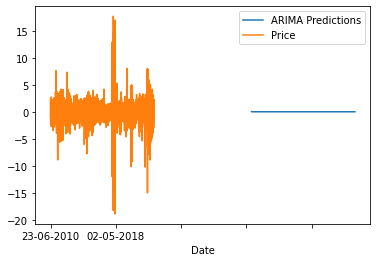

In [130]:
pred_arima_model.plot(legend=True)
Test1['Price'].plot(legend=True)  

In [131]:
from sklearn.metrics import mean_squared_error
from math import sqrt 

In [132]:
rmse_arima_model=sqrt(mean_squared_error(pred_arima_model,Test1['Price']))
print(rmse_arima_model)  

1.8434692984606653


## Data Driven Methods

### Simple Exponential Method

In [133]:
Train["Price"] = Train["Price"].astype('double') 

In [134]:
ses_model = SimpleExpSmoothing(Train["Price"]).fit(smoothing_level=0.2) #alpha = 0.2
pred_ses_model = ses_model.predict(start = Test.index[0],end = Test.index[-1])
pred_ses_model 

6160    76.12325
6161    76.12325
6162    76.12325
6163    76.12325
6164    76.12325
          ...   
9327    76.12325
9328    76.12325
9329    76.12325
9330    76.12325
9331    76.12325
Length: 3172, dtype: float64

In [135]:
MAPE_ses=MAPE(pred_ses_model,Test['Price']) 
MAPE_ses 

37.92688449203159

In [136]:
rmse_ses_model = np.sqrt(np.mean((np.array(Test['Price'])-np.array(np.exp(pred_ses_model)))**2))
rmse_ses_model 

1.1479093576730548e+33

### Holt method 

In [137]:
holt_model = Holt(Train["Price"]).fit(smoothing_level=0.8, smoothing_slope=0.2) #alpha = 0.8, beta= 0.2
pred_holt_model = holt_model.predict(start = Test.index[0],end = Test.index[-1])
pred_holt_model 

6160      78.222806
6161      78.644581
6162      79.066356
6163      79.488131
6164      79.909906
           ...     
9327    1413.984610
9328    1414.406385
9329    1414.828160
9330    1415.249935
9331    1415.671710
Length: 3172, dtype: float64

In [138]:
MAPE_holt=MAPE(pred_holt_model,Test.Price) 
MAPE_holt

1181.9953120795158

In [139]:
rmse_holt_model = np.sqrt(np.mean((np.array(Test['Price'])-np.array(np.exp(pred_holt_model)))**2))
rmse_holt_model 

inf

### Holts winter exponential smoothing with additive seasonality and additive trend

In [140]:
hwe_add_add_model = ExponentialSmoothing(Train["Price"],seasonal="add",trend="add",seasonal_periods=12).fit() #add the trend to the model
pred_hwe_add_add_model = hwe_add_add_model.predict(start = Test.index[0],end = Test.index[-1])
pred_hwe_add_add_model 

6160     77.745501
6161     77.770471
6162     77.786469
6163     77.904869
6164     77.971346
           ...    
9327    104.634873
9328    104.581582
9329    104.606552
9330    104.622551
9331    104.740950
Length: 3172, dtype: float64

In [141]:
MAPE_hwe_add_add=MAPE(pred_hwe_add_add_model,Test.Price) 
MAPE_hwe_add_add 

56.690099999775605

In [142]:
rmse_hwe_add_add_model = np.sqrt(np.mean((np.array(Test['Price'])-np.array(np.exp(pred_hwe_add_add_model)))**2))
rmse_hwe_add_add_model 

3.975633417476676e+44

### Holts winter exponential smoothing with multiplicative seasonality and additive trend

In [143]:
hwe_mult_add_model= ExponentialSmoothing(Train["Price"],seasonal="mul",trend="add",seasonal_periods=12).fit() 
pred_hwe_mult_add_model = hwe_mult_add_model.predict(start = Test.index[0],end = Test.index[-1]) 
pred_hwe_mult_add_model 

6160     77.569750
6161     77.661474
6162     77.549355
6163     77.933780
6164     78.202190
           ...    
9327    104.237057
9328    103.916907
9329    104.036958
9330    103.883937
9331    104.396071
Length: 3172, dtype: float64

In [144]:
MAPE_hwe_mult_add=MAPE(pred_hwe_mult_add_model,Test.Price) 
MAPE_hwe_mult_add 

56.39117775338492

In [145]:
rmse_hwe_mult_add_model = np.sqrt(np.mean((np.array(Test['Price'])-np.array(np.exp(pred_hwe_mult_add_model)))**2))
rmse_hwe_mult_add_model 

2.7950148024719968e+44

### RMSE, MAPE values table

In [146]:
df1 = {"MODEL":pd.Series(["Ses_model","Holt_model","Hwe_add_add_model ","Hwe_mult_add_model"]),
       "RMSE_Values":pd.Series([rmse_ses_model,rmse_holt_model,rmse_hwe_add_add_model ,rmse_hwe_mult_add_model]),
       "MAPE_Values":pd.Series([MAPE_ses,MAPE_holt,MAPE_hwe_add_add,MAPE_hwe_mult_add])}

table1=pd.DataFrame(df1) 
table1 

,MODEL,RMSE_Values,MAPE_Values
0,Ses_model,1.147909e+33,37.926884
1,Holt_model,inf,1181.995312
2,Hwe_add_add_model,3.975633e+44,56.690100
3,Hwe_mult_add_model,2.795015e+44,56.391178


## FB Prophet Model

In [147]:
!pip install prophet 

In [148]:
from prophet.plot import plot_plotly, plot_components_plotly
from prophet import Prophet 

In [149]:
data10=data3.reset_index()
data10 

,Date,Price
0,02-01-1986,25.56
1,03-01-1986,26.00
2,06-01-1986,26.53
3,07-01-1986,25.85
4,08-01-1986,25.87
...,...,...
9327,15-12-2022,76.11
9328,16-12-2022,74.29
9329,19-12-2022,75.19
9330,20-12-2022,76.09


In [150]:
data11=data10.copy()
data11 

,Date,Price
0,02-01-1986,25.56
1,03-01-1986,26.00
2,06-01-1986,26.53
3,07-01-1986,25.85
4,08-01-1986,25.87
...,...,...
9327,15-12-2022,76.11
9328,16-12-2022,74.29
9329,19-12-2022,75.19
9330,20-12-2022,76.09


In [151]:
data11.columns = ['ds','y'] 
data11  

,ds,y
0,02-01-1986,25.56
1,03-01-1986,26.00
2,06-01-1986,26.53
3,07-01-1986,25.85
4,08-01-1986,25.87
...,...,...
9327,15-12-2022,76.11
9328,16-12-2022,74.29
9329,19-12-2022,75.19
9330,20-12-2022,76.09


In [152]:
data11.dtypes 

ds     object
y     float64
dtype: object

In [153]:
data11['ds'] = pd.to_datetime(data11['ds'])
data11 

,ds,y
0,1986-02-01,25.56
1,1986-03-01,26.00
2,1986-06-01,26.53
3,1986-07-01,25.85
4,1986-08-01,25.87
...,...,...
9327,2022-12-15,76.11
9328,2022-12-16,74.29
9329,2022-12-19,75.19
9330,2022-12-20,76.09


In [154]:
data11.dtypes  

ds    datetime64[ns]
y            float64
dtype: object

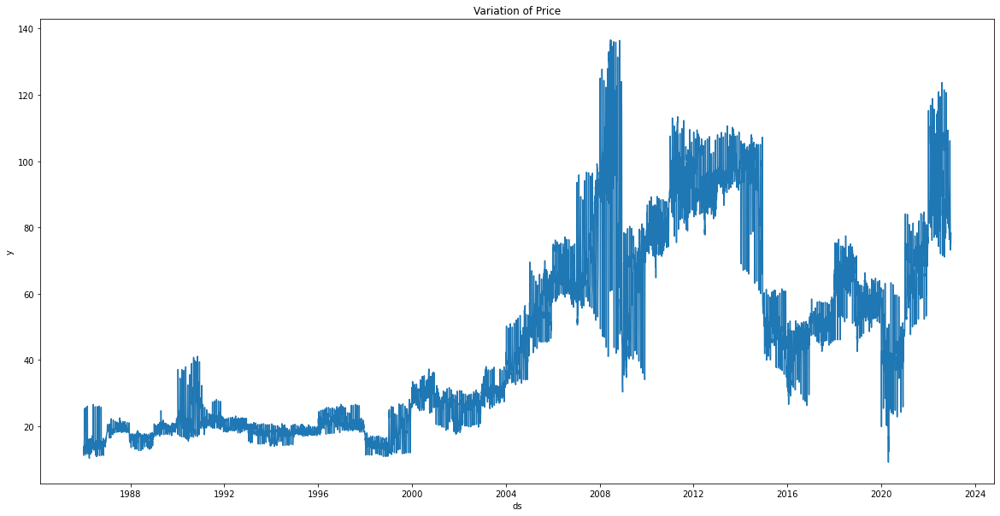

In [155]:
plt.figure(figsize=(20,10))
sns.lineplot(x=data11['ds'],y=data11['y'],data=data11)
plt.title('Variation of Price')
plt.show() 

In [156]:
#Data Partition
Train2 = data11.iloc[:len(data11)-150] # Total data except last 150 observations
Test2 = data11.iloc[len(data11)-150:] # Only last 150 observations

In [157]:
prophet_model = Prophet()
prophet_model.fit(Train2)
future = prophet_model.make_future_dataframe(periods=391) 
forecast_prophet = prophet_model.predict(future) 

16:26:20 - cmdstanpy - INFO - Chain [1] start processing
16:26:25 - cmdstanpy - INFO - Chain [1] done processing


In [158]:
forecast_prophet  

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1986-01-04,15.055310,1.441223,27.159055,15.055310,15.055310,-0.174019,-0.174019,-0.174019,0.609667,0.609667,0.609667,-0.783686,-0.783686,-0.783686,0.0,0.0,0.0,14.881291
1,1986-01-05,15.059272,0.812195,27.152752,15.059272,15.059272,-1.051211,-1.051211,-1.051211,-0.339742,-0.339742,-0.339742,-0.711469,-0.711469,-0.711469,0.0,0.0,0.0,14.008060
2,1986-01-07,15.067195,2.103430,27.572029,15.067195,15.067195,-0.690628,-0.690628,-0.690628,-0.096445,-0.096445,-0.096445,-0.594183,-0.594183,-0.594183,0.0,0.0,0.0,14.376567
3,1986-01-08,15.071156,2.575248,26.519429,15.071156,15.071156,-0.764112,-0.764112,-0.764112,-0.213630,-0.213630,-0.213630,-0.550482,-0.550482,-0.550482,0.0,0.0,0.0,14.307044
4,1986-01-10,15.079080,2.240920,27.392132,15.079080,15.079080,-0.689063,-0.689063,-0.689063,-0.194453,-0.194453,-0.194453,-0.494610,-0.494610,-0.494610,0.0,0.0,0.0,14.390017
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9568,2023-12-27,69.493388,53.779933,82.656008,66.608857,73.693839,-1.784726,-1.784726,-1.784726,-0.213630,-0.213630,-0.213630,-1.571096,-1.571096,-1.571096,0.0,0.0,0.0,67.708662
9569,2023-12-28,69.499870,54.114326,83.045652,66.597127,73.721839,-1.333154,-1.333154,-1.333154,0.145360,0.145360,0.145360,-1.478514,-1.478514,-1.478514,0.0,0.0,0.0,68.166716
9570,2023-12-29,69.506351,55.159574,81.852766,66.592749,73.742863,-1.576906,-1.576906,-1.576906,-0.194453,-0.194453,-0.194453,-1.382453,-1.382453,-1.382453,0.0,0.0,0.0,67.929445
9571,2023-12-30,69.512833,55.200484,82.589802,66.589249,73.764448,-0.674833,-0.674833,-0.674833,0.609667,0.609667,0.609667,-1.284501,-1.284501,-1.284501,0.0,0.0,0.0,68.838000


In [159]:
forecast_prophet[['ds', 'yhat', 'yhat_lower', 'yhat_upper']] 

,ds,yhat,yhat_lower,yhat_upper
0,1986-01-04,14.881291,1.441223,27.159055
1,1986-01-05,14.008060,0.812195,27.152752
2,1986-01-07,14.376567,2.103430,27.572029
3,1986-01-08,14.307044,2.575248,26.519429
4,1986-01-10,14.390017,2.240920,27.392132
...,...,...,...,...
9568,2023-12-27,67.708662,53.779933,82.656008
9569,2023-12-28,68.166716,54.114326,83.045652
9570,2023-12-29,67.929445,55.159574,81.852766
9571,2023-12-30,68.838000,55.200484,82.589802


In [160]:
Fcast = forecast_prophet.set_index('ds')[['yhat','yhat_lower','yhat_upper']].join(Train2.set_index('ds')) 
Fcast 

,yhat,yhat_lower,yhat_upper,y
ds,,,,
1986-01-04,14.881291,1.441223,27.159055,11.13
1986-01-05,14.008060,0.812195,27.152752,13.80
1986-01-07,14.376567,2.103430,27.572029,12.39
1986-01-08,14.307044,2.575248,26.519429,11.56
1986-01-10,14.390017,2.240920,27.392132,15.23
...,...,...,...,...
2023-12-27,67.708662,53.779933,82.656008,NaN
2023-12-28,68.166716,54.114326,83.045652,NaN
2023-12-29,67.929445,55.159574,81.852766,NaN


In [161]:
Test2 

,ds,y
9182,2022-05-19,112.21
9183,2022-05-20,113.23
9184,2022-05-23,110.29
9185,2022-05-24,109.77
9186,2022-05-25,110.33
...,...,...
9327,2022-12-15,76.11
9328,2022-12-16,74.29
9329,2022-12-19,75.19
9330,2022-12-20,76.09


### FB Prophet Visualisation

In [162]:
plot_plotly(prophet_model ,forecast_prophet) 

In [163]:
plot_components_plotly(prophet_model, forecast_prophet) 

In [164]:
pred_prophet = forecast_prophet.iloc[-391:]['yhat'] 
pred_prophet 

9182    65.274690
9183    65.108831
9184    65.418735
9185    65.030578
9186    65.788325
          ...    
9568    67.708662
9569    68.166716
9570    67.929445
9571    68.838000
9572    67.993285
Name: yhat, Length: 391, dtype: float64

In [165]:
from  sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score 
from statsmodels.tools.eval_measures import rmse 

In [166]:
## Calculate MAE,MSE,R-Squared between expected and predicted values  
y_true = Train2['y'].iloc[:9182] 
y_pred = Fcast['yhat'].iloc[:9182] 
mae = mean_absolute_error(y_true,y_pred)
mse = mean_squared_error(y_true,y_pred)
rmse = sqrt(mean_squared_error(y_true,y_pred))
print('rmse: %.2f' % rmse)
print('MAE: %.2f' % mae)
print('MSE: %.2f' % mse)
r = r2_score(y_true,y_pred)
print('R-squared Score: %.2f'% r)  

rmse: 9.81
MAE: 6.15
MSE: 96.16
R-squared Score: 0.88


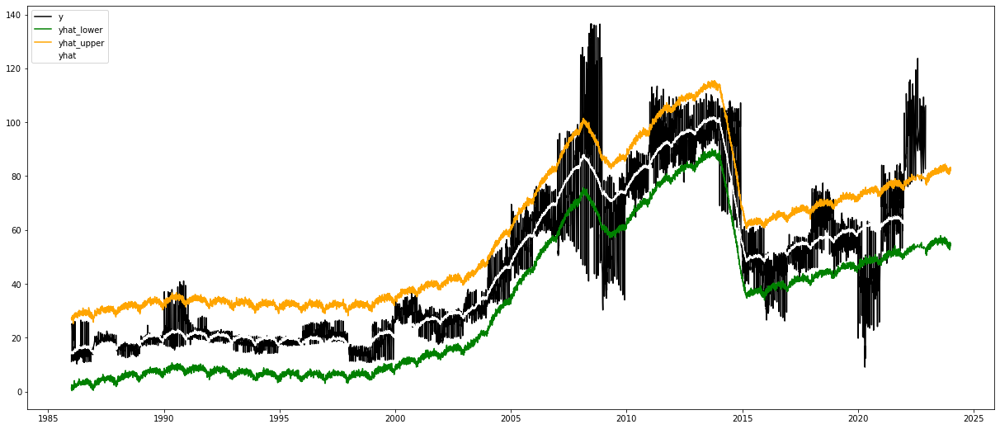

In [167]:
plt.figure(figsize=(21,9))
label=['y','yhat_lower','yhat_upper','yhat']
plt.plot(Fcast['y'],color='black')
plt.plot(Fcast['yhat_lower'],color='Green')
plt.plot(Fcast['yhat_upper'],color='Orange') 
plt.plot(Fcast['yhat'],color='White') 
plt.legend(label)
plt.show() 

## Naive Model (Last Sample Method)

In [168]:
Train3 = data10.head(6160)
Test3 = data10.tail(3172) 

In [169]:
y_hat=Test3.copy()
y_hat 

,Date,Price
6160,22-06-2010,77.15
6161,23-06-2010,75.90
6162,24-06-2010,75.96
6163,25-06-2010,78.45
6164,28-06-2010,78.26
...,...,...
9327,15-12-2022,76.11
9328,16-12-2022,74.29
9329,19-12-2022,75.19
9330,20-12-2022,76.09


In [170]:
df3=np.asarray(Train3.Price)
df3 

array([25.56, 26.  , 26.53, ..., 76.82, 77.18, 77.84])

In [171]:
y_hat['naive']=df3[len(df3)-1]
y_hat 

,Date,Price,naive
6160,22-06-2010,77.15,77.84
6161,23-06-2010,75.90,77.84
6162,24-06-2010,75.96,77.84
6163,25-06-2010,78.45,77.84
6164,28-06-2010,78.26,77.84
...,...,...,...
9327,15-12-2022,76.11,77.84
9328,16-12-2022,74.29,77.84
9329,19-12-2022,75.19,77.84
9330,20-12-2022,76.09,77.84


In [172]:
rmse_naive_model = np.sqrt(np.mean((np.array(Test3['Price'])-np.array(np.exp(y_hat['naive'])))**2))
rmse_naive_model 

6.389729471063823e+33

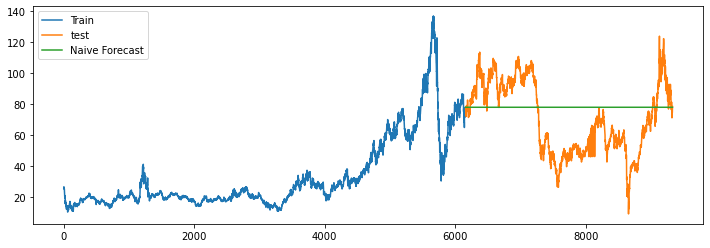

In [173]:
plt.figure(figsize=(12,4))
plt.plot(Train3['Price'], label='Train')
plt.plot(Test3['Price'], label='test')
plt.plot(y_hat['naive'], label='Naive Forecast')
plt.legend(loc='best')
plt.show() 

## Simple Averages Method

In [174]:
y_hat_avg=Test3.copy()
y_hat_avg 

,Date,Price
6160,22-06-2010,77.15
6161,23-06-2010,75.90
6162,24-06-2010,75.96
6163,25-06-2010,78.45
6164,28-06-2010,78.26
...,...,...
9327,15-12-2022,76.11
9328,16-12-2022,74.29
9329,19-12-2022,75.19
9330,20-12-2022,76.09


In [175]:
y_hat_avg['avg_forecast']=Train3['Price'].mean()
y_hat_avg 

,Date,Price,avg_forecast
6160,22-06-2010,77.15,33.045834
6161,23-06-2010,75.90,33.045834
6162,24-06-2010,75.96,33.045834
6163,25-06-2010,78.45,33.045834
6164,28-06-2010,78.26,33.045834
...,...,...,...
9327,15-12-2022,76.11,33.045834
9328,16-12-2022,74.29,33.045834
9329,19-12-2022,75.19,33.045834
9330,20-12-2022,76.09,33.045834


In [176]:
rmse_simple_model = np.sqrt(np.mean((np.array(Test3['Price'])-np.array(np.exp(y_hat_avg['avg_forecast'])))**2))
rmse_simple_model 

224710588217781.75

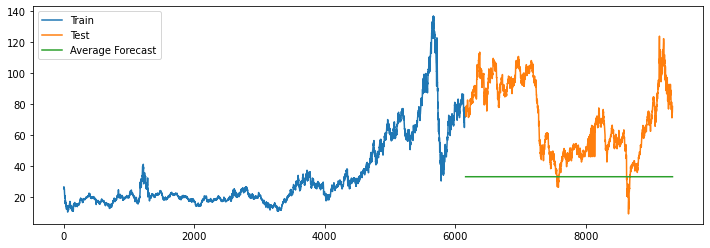

In [177]:
plt.figure(figsize=(12,4))
plt.plot(Train3['Price'], label='Train')
plt.plot(Test3['Price'], label='Test')
plt.plot(y_hat_avg['avg_forecast'], label='Average Forecast')
plt.legend(loc='best')
plt.show() 

## Long Short Term Memory (LSTM) Model

In [178]:
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import GRU, Dense
from keras.layers import LSTM
from keras  import callbacks
from keras import optimizers   

In [179]:
data3 

,Price
Date,
02-01-1986,25.56
03-01-1986,26.00
06-01-1986,26.53
07-01-1986,25.85
08-01-1986,25.87
...,...
15-12-2022,76.11
16-12-2022,74.29
19-12-2022,75.19


In [180]:
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(data3) 
scaled 

array([[0.12943207],
       [0.13288359],
       [0.1370411 ],
       ...,
       [0.51874804],
       [0.52580797],
       [0.54306558]])

In [181]:
train_size = int(len(scaled) * 0.66)
test_size = len(scaled - train_size)
train, test = scaled[0:train_size, :], scaled[train_size: len(scaled), :]
print('train: {}\ntest: {}'.format(len(train), len(test)))   

train: 6159
test: 3173


In [182]:
def create_dataset(dataset, look_back=1):
    print(len(dataset), look_back)
    dataX, dataY = [], []
    for i in range(len(dataset)-look_back-1):
        a = dataset[i:(i+look_back), 0]
        print(i)
        print('X {} to {}'.format(i, i+look_back))
        print(a)
        print('Y {}'.format(i + look_back))
        print(dataset[i + look_back, 0])
        dataset[i + look_back, 0]
        dataX.append(a)
        dataY.append(dataset[i + look_back, 0])
    return np.array(dataX), np.array(dataY)    

In [183]:
look_back = 1
X_train, y_train = create_dataset(train, look_back)
X_test, y_test = create_dataset(test, look_back) 

6159 1
0
X 0 to 1
[0.12943207]
Y 1
0.13288358958267965
1
X 1 to 2
[0.13288359]
Y 2
0.13704110448697837
2
X 2 to 3
[0.1370411]
Y 3
0.1317069344210857
3
X 3 to 4
[0.13170693]
Y 4
0.1318638217759649
4
X 4 to 5
[0.13186382]
Y 5
0.13311892061499847
5
X 5 to 6
[0.13311892]
Y 6
0.1301380608722937
6
X 6 to 7
[0.13013806]
Y 7
0.12566677125823658
7
X 7 to 8
[0.12566677]
Y 8
0.124803890806401
8
X 8 to 9
[0.12480389]
Y 9
0.12645120803263257
9
X 9 to 10
[0.12645121]
Y 10
0.11703796673988079
10
X 10 to 11
[0.11703797]
Y 11
0.11429243802949482
11
X 11 to 12
[0.11429244]
Y 12
0.09625039221838719
12
X 12 to 13
[0.09625039]
Y 13
0.09060244744273613
13
X 13 to 14
[0.09060245]
Y 14
0.0877784750549106
14
X 14 to 15
[0.08777848]
Y 15
0.08526827737684345
15
X 15 to 16
[0.08526828]
Y 16
0.08150298085974272
16
X 16 to 17
[0.08150298]
Y 17
0.0926419830561657
17
X 17 to 18
[0.09264198]
Y 18
0.08150298085974272
18
X 18 to 19
[0.08150298]
Y 19
0.0827580796987763
19
X 19 to 20
[0.08275808]
Y 20
0.08252274866645748


In [184]:
## Reshaping the input data 
X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
print(X_train.shape)
print(X_test.shape) 

(6157, 1, 1)
(3171, 1, 1)


In [185]:
batch_size = 1
model_lstm = Sequential()
model_lstm.add(LSTM(4, batch_input_shape=(batch_size, look_back, 1), stateful=True))
model_lstm.add(Dense(1))
model_lstm.compile(loss='mean_squared_error', optimizer='adam')
model_lstm.fit(X_train, y_train, epochs=100, batch_size=batch_size, verbose=2, shuffle=True)  

Epoch 1/100
6157/6157 - 17s - loss: 0.0042 - 17s/epoch - 3ms/step
Epoch 2/100
6157/6157 - 14s - loss: 1.8661e-04 - 14s/epoch - 2ms/step
Epoch 3/100
6157/6157 - 14s - loss: 1.8215e-04 - 14s/epoch - 2ms/step
Epoch 4/100
6157/6157 - 13s - loss: 1.9892e-04 - 13s/epoch - 2ms/step
Epoch 5/100
6157/6157 - 14s - loss: 1.9944e-04 - 14s/epoch - 2ms/step
Epoch 6/100
6157/6157 - 15s - loss: 1.9129e-04 - 15s/epoch - 2ms/step
Epoch 7/100
6157/6157 - 14s - loss: 1.5675e-04 - 14s/epoch - 2ms/step
Epoch 8/100
6157/6157 - 19s - loss: 1.3085e-04 - 19s/epoch - 3ms/step
Epoch 9/100
6157/6157 - 15s - loss: 1.1229e-04 - 15s/epoch - 2ms/step
Epoch 10/100
6157/6157 - 15s - loss: 1.0049e-04 - 15s/epoch - 2ms/step
Epoch 11/100
6157/6157 - 14s - loss: 9.5879e-05 - 14s/epoch - 2ms/step
Epoch 12/100
6157/6157 - 14s - loss: 9.3457e-05 - 14s/epoch - 2ms/step
Epoch 13/100
6157/6157 - 14s - loss: 9.3752e-05 - 14s/epoch - 2ms/step
Epoch 14/100
6157/6157 - 13s - loss: 8.9626e-05 - 13s/epoch - 2ms/step
Epoch 15/100
6157/6

In [186]:
trainPredict = model_lstm.predict(X_train, batch_size=batch_size)
trainPredict

6157/6157 [==============================] - 7s 1ms/step


array([[0.13063477],
       [0.13468878],
       [0.13871922],
       ...,
       [0.51531905],
       [0.5295845 ],
       [0.5359194 ]], dtype=float32)

In [187]:
model_lstm.reset_states() 

In [188]:
testPredict = model_lstm.predict(X_test, batch_size=batch_size)
testPredict

3171/3171 [==============================] - 3s 1ms/step


array([[0.5211    ],
       [0.53842676],
       [0.518995  ],
       ...,
       [0.5238353 ],
       [0.5097627 ],
       [0.5168152 ]], dtype=float32)

In [189]:
trainPredict = scaler.inverse_transform(trainPredict)
trainPredict 

array([[25.71332 ],
       [26.230125],
       [26.743925],
       ...,
       [74.75287 ],
       [76.571434],
       [77.379005]], dtype=float32)

In [190]:
y_train = scaler.inverse_transform([y_train])
y_train

array([[26.  , 26.53, 25.85, ..., 76.84, 77.67, 76.82]])

In [191]:
testPredict = scaler.inverse_transform(testPredict)
testPredict 

array([[75.48982 ],
       [77.69864 ],
       [75.22148 ],
       ...,
       [75.838524],
       [74.04455 ],
       [74.943596]], dtype=float32)

In [192]:
y_test = scaler.inverse_transform([y_test])
y_test

array([[77.15, 75.9 , 75.96, ..., 74.29, 75.19, 76.09]])

In [193]:
# calculate root mean squared error
trainScore = math.sqrt(mean_squared_error(y_train[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(y_test[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore)) 

Train Score: 1.08 RMSE
Test Score: 1.90 RMSE


In [194]:
print('R2 score:',r2_score(y_train[0],trainPredict[:,0])) 

R2 score: 0.9978606799263813


In [195]:
print('R2 Score:',r2_score(y_test[0],testPredict[:,0])) 

R2 Score: 0.993183636399215


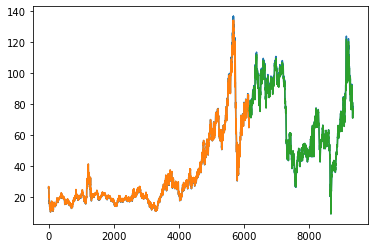

In [196]:
trainPredictPlot = np.empty_like(scaled)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(scaled)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(scaled)-1, :] = testPredict
# plot baseline and predictions

plt.plot(scaler.inverse_transform(scaled))
plt.plot(trainPredictPlot)
plt.plot(testPredictPlot)
plt.show()   

In [197]:
import pickle 

In [198]:
filename = ('trained_model(3).pkl') ## using Prophet model for deployment (Fcast)
pickle.dump(Fcast,open(filename, 'wb'))      

In [199]:
loaded_model = pickle.load(open('trained_model(3).pkl','rb'))    